In [ ]:
import numpy as np
import torch
from torch_geometric.data import Data
from collections import defaultdict
from opencood.data_utils.datasets import COM_RANGE as Threshold
from opencood.data_utils.datasets.basedataset import BaseDataset
from tqdm import tqdm
from IPython.display import HTML

class V2VGraphCreator:
    def __init__(self, base_dataset, distance_threshold=Threshold):
        """
        Creates graphs from V2V communication data using BaseDataset.
        
        Parameters:
        -----------
        base_dataset : BaseDataset
            Initialized BaseDataset object
        distance_threshold : float
            Maximum distance for creating edges between vehicles (meters)
        """
        self.dataset = base_dataset
        self.distance_threshold = distance_threshold
    
    def create_graph(self, idx):
        """
        Creates a graph for a specific timestamp.
        
        Parameters:
        -----------
        idx : int
            Index of the timestamp
            
        Returns:
        --------
        data : torch_geometric.data.Data
            Graph containing:
            - x: Node features [num_nodes, node_features]
            - edge_index: Graph connectivity [2, num_edges]
            - edge_attr: Edge features [num_edges, edge_features]
            - pos: Node positions [num_nodes, 2]
            - timestamp: Current timestamp
        """
        # Get base data for this timestamp
        base_data = self.dataset.retrieve_base_data(idx)
        
        # Lists to store node and edge information
        node_features = []
        node_positions = []
        edges = []
        edge_features = []
        vehicle_ids = []
        
        # Create mapping from vehicle ID to node index
        id_to_idx = {}
        
        # Extract node features
        for i, (cav_id, cav_data) in enumerate(base_data.items()):
            vehicle_ids.append(cav_id)
            id_to_idx[cav_id] = i
            
            # Get vehicle pose and speed
            pose = cav_data['params']['lidar_pose']  # [x, y, z, roll, yaw, pitch]
            speed = cav_data['params'].get('ego_speed', 0.0)
            time_delay = cav_data['time_delay']
            is_ego = 1.0 if cav_data['ego'] else 0.0
            
            # Node features: [x, y, z, roll, yaw, pitch, speed, time_delay, is_ego]
            node_feat = np.array(pose + [speed, time_delay, is_ego])
            node_pos = np.array(pose[:2])  # x, y coordinates
            
            node_features.append(node_feat)
            node_positions.append(node_pos)
        
        # Create edges based on distance threshold
        for i, id1 in enumerate(vehicle_ids):
            pos1 = node_positions[i]
            for j, id2 in enumerate(vehicle_ids):
                if i != j:
                    pos2 = node_positions[j]
                    dist = np.linalg.norm(pos1 - pos2)
                    
                    if dist <= self.distance_threshold:
                        # Add edge
                        edges.append([i, j])
                        
                        # Edge features: [distance, relative_speed, time_delay_diff]
                        speed1 = node_features[i][6]
                        speed2 = node_features[j][6]
                        time_delay1 = node_features[i][7]
                        time_delay2 = node_features[j][7]
                        
                        edge_feat = [
                            dist,
                            abs(speed1 - speed2),
                            abs(time_delay1 - time_delay2)
                        ]
                        edge_features.append(edge_feat)
        
        # Convert to PyTorch tensors
        x = torch.FloatTensor(node_features)
        edge_index = torch.LongTensor(edges).t().contiguous()
        edge_attr = torch.FloatTensor(edge_features) if edges else torch.zeros((0, 3))
        pos = torch.FloatTensor(node_positions)
        
        # Create the graph
        data = Data(
            x=x,
            edge_index=edge_index,
            edge_attr=edge_attr,
            pos=pos,
            vehicle_ids=vehicle_ids,
            timestamp=idx
        )
        
        return data
    
    def create_temporal_graph_sequence(self, start_idx, sequence_length=5):
        """
        Creates a sequence of temporal graphs.
        
        Parameters:
        -----------
        start_idx : int
            Starting timestamp index
        sequence_length : int
            Number of consecutive timestamps to include
            
        Returns:
        --------
        temporal_graphs : list
            List of Data objects representing the temporal sequence
            
        vehicle_trajectories : dict
            Dictionary containing vehicle trajectories over the sequence
        """
        temporal_graphs = []
        vehicle_trajectories = defaultdict(list)
        
        # Create graphs for the sequence with tqdm progress bar
        for offset in tqdm(range(sequence_length), 
                        desc="Creating temporal graphs", 
                        unit="graph"):
            idx = start_idx + offset
            if idx >= len(self.dataset):
                break
                
            graph = self.create_graph(idx)
            temporal_graphs.append(graph)
            
            # Record vehicle positions and features
            for i, vid in enumerate(graph.vehicle_ids):
                vehicle_trajectories[vid].append({
                    'position': graph.pos[i].numpy(),
                    'features': graph.x[i].numpy(),
                    'timestamp': idx
                })
        
        return temporal_graphs, vehicle_trajectories
    
    def get_scenario_splits(self):
        """
        Returns the indices where new scenarios start.
        
        Returns:
        --------
        scenario_splits : list
            List of indices where new scenarios begin
        """
        return self.dataset.len_record

def create_example_visualization(graph):
    """
    Creates a basic visualization of the graph structure.
    Returns a string representation of nodes and edges.
    """
    viz = "Graph Summary:\n"
    viz += f"Number of nodes: {graph.x.shape[0]}\n"
    viz += f"Number of edges: {graph.edge_index.shape[1]}\n"
    viz += f"Node feature dimensions: {graph.x.shape[1]}\n"
    viz += f"Edge feature dimensions: {graph.edge_attr.shape[1]}\n"
    
    # Add node positions
    viz += "\nNode Positions:\n"
    for i, pos in enumerate(graph.pos):
        viz += f"Vehicle {graph.vehicle_ids[i]}: ({pos[0]:.2f}, {pos[1]:.2f})\n"
    
    return viz

In [18]:
params = {
    'root_dir': '/home/xavierallem/Opencood_testing/OpenCOOD/OPV2V/scenario_train',
    'data_augment': {},
    'train_params': {'max_cav': 10},
}
base_dataset = BaseDataset(params=params, visualize=False, train=True)
print(f"Dataset initialized with {len(base_dataset)} samples.")

Dataset initialized with 493 samples.


In [19]:
# Create graph creator
graph_creator = V2VGraphCreator(base_dataset, distance_threshold=50.0)

# Create a single graph for one timestamp
graph = graph_creator.create_graph(idx=0)
print(create_example_visualization(graph))

Graph Summary:
Number of nodes: 3
Number of edges: 4
Node feature dimensions: 9
Edge feature dimensions: 3

Node Positions:
Vehicle 641: (48.37, 139.53)
Vehicle 650: (78.90, 143.44)
Vehicle 659: (98.65, 136.46)



In [20]:
# Create temporal graph sequence
temporal_graphs, trajectories = graph_creator.create_temporal_graph_sequence(
    start_idx=0, 
    sequence_length=910
)

# Print scenario splits
scenario_splits = graph_creator.get_scenario_splits()
print("Scenario split points:", scenario_splits)

Creating temporal graphs:  54%|█████▍    | 493/910 [06:07<05:11,  1.34graph/s]

Scenario split points: [419, 493]


In [27]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.animation import FuncAnimation
import matplotlib.colors as mcolors
from IPython.display import display, HTML

class V2VGraphVisualizer:
    def __init__(self):
        """
        Initialize the visualizer with color schemes and styling
        """
        self.node_colors = {
            'ego': '#FF6B6B',  # Red for ego vehicle
            'others': '#4ECDC4'  # Cyan for other vehicles
        }
        self.edge_cmap = plt.cm.YlOrRd  # Yellow to Red colormap for edges
        
    def visualize_single_timestamp(self, graph):
        """
        Visualize and display a single graph from one timestamp.
        """
        plt.figure(figsize=(12, 8))
        
        # Create networkx graph
        G = nx.DiGraph()
        
        # Add nodes
        pos = {}
        node_colors = []
        node_sizes = []
        
        for i, (x, y) in enumerate(graph.pos):
            G.add_node(i)
            pos[i] = (float(x), float(y))
            
            # Color nodes based on ego status
            is_ego = bool(graph.x[i, -1])  # last feature is ego flag
            node_colors.append(self.node_colors['ego'] if is_ego else self.node_colors['others'])
            node_sizes.append(200 if is_ego else 100)
            
        # Add edges
        edge_colors = []
        for i in range(graph.edge_index.shape[1]):
            src, dst = graph.edge_index[:, i]
            dist = graph.edge_attr[i, 0]  # first edge feature is distance
            G.add_edge(int(src), int(dst))
            edge_colors.append(dist)
            
        # Normalize edge colors if there are any edges
        if len(edge_colors) > 0:
            edge_colors = np.array(edge_colors)
            edge_colors = (edge_colors - edge_colors.min()) / (edge_colors.max() - edge_colors.min() + 1e-6)
        
        # Draw the graph
        plt.clf()
        nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=node_sizes)
        
        # Draw edges if they exist
        if len(edge_colors) > 0:
            edges = nx.draw_networkx_edges(G, pos, edge_color=edge_colors, edge_cmap=self.edge_cmap,
                                         arrows=True, arrowsize=10, width=2)
            
            # Add colorbar only if there are edges
            sm = plt.cm.ScalarMappable(cmap=self.edge_cmap)
            sm.set_array(edge_colors)
            plt.colorbar(sm, label='Normalized Distance')
        
        # Add labels
        labels = {i: f"V{vid}" for i, vid in enumerate(graph.vehicle_ids)}
        nx.draw_networkx_labels(G, pos, labels)
        
        plt.title(f'V2V Communication Graph (Timestamp: {graph.timestamp})')
        plt.xlabel('X Position (m)')
        plt.ylabel('Y Position (m)')
        
        # Make axis equal and add grid
        plt.grid(True)
        plt.axis('equal')
        
        plt.show()
        
    def visualize_temporal_sequence(self, temporal_graphs):
        """
        Visualize and display a sequence of temporal graphs as an animation.
        """
        fig, ax = plt.subplots(figsize=(12, 8))
        plt.close()
        
        # Pre-compute all graph layouts to ensure consistency
        print("Pre-computing graph layouts...")
        all_positions = []
        all_nodes = set()
        
        for graph in tqdm(temporal_graphs, desc="Processing frames"):
            pos = {i: (float(x), float(y)) for i, (x, y) in enumerate(graph.pos)}
            all_positions.append(pos)
            all_nodes.update(pos.keys())
        
        # Find global axis limits for consistent view
        all_x = []
        all_y = []
        for pos in all_positions:
            x_coords = [p[0] for p in pos.values()]
            y_coords = [p[1] for p in pos.values()]
            all_x.extend(x_coords)
            all_y.extend(y_coords)
        
        x_min, x_max = min(all_x), max(all_x)
        y_min, y_max = min(all_y), max(all_y)
        
        def update(frame):
            ax.clear()
            graph = temporal_graphs[frame]
            pos = all_positions[frame]
            
            G = nx.DiGraph()
            node_colors = []
            node_sizes = []
            
            # Add nodes
            for i in range(len(graph.pos)):
                G.add_node(i)
                is_ego = bool(graph.x[i, -1])
                node_colors.append(self.node_colors['ego'] if is_ego else self.node_colors['others'])
                node_sizes.append(200 if is_ego else 100)
            
            # Add edges if they exist
            edge_colors = []
            if hasattr(graph, 'edge_index') and graph.edge_index.numel() > 0:
                for i in range(graph.edge_index.shape[1]):
                    src, dst = graph.edge_index[:, i]
                    dist = graph.edge_attr[i, 0]
                    G.add_edge(int(src), int(dst))
                    edge_colors.append(float(dist))
            
            # Draw nodes
            nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=node_sizes, ax=ax)
            
            # Draw edges if they exist
            if edge_colors:
                edge_colors = np.array(edge_colors)
                edge_colors = (edge_colors - edge_colors.min()) / (edge_colors.max() - edge_colors.min() + 1e-6)
                nx.draw_networkx_edges(G, pos, edge_color=edge_colors, edge_cmap=self.edge_cmap,
                                     arrows=True, arrowsize=10, width=2, ax=ax)
            
            # Add labels
            labels = {i: f"V{vid}" for i, vid in enumerate(graph.vehicle_ids)}
            nx.draw_networkx_labels(G, pos, labels, ax=ax)
            
            # Set consistent axes limits
            ax.set_xlim(x_min - 10, x_max + 10)
            ax.set_ylim(y_min - 10, y_max + 10)
            
            ax.grid(True)
            ax.set_aspect('equal')
            ax.set_title(f'V2V Communication Graph (Timestamp: {graph.timestamp})')
            ax.set_xlabel('X Position (m)')
            ax.set_ylabel('Y Position (m)')
            
            return ax
        
        print("Creating animation...")
        anim = FuncAnimation(fig, update, frames=len(temporal_graphs), interval=500)
        print("Displaying animation...")
        
        return anim

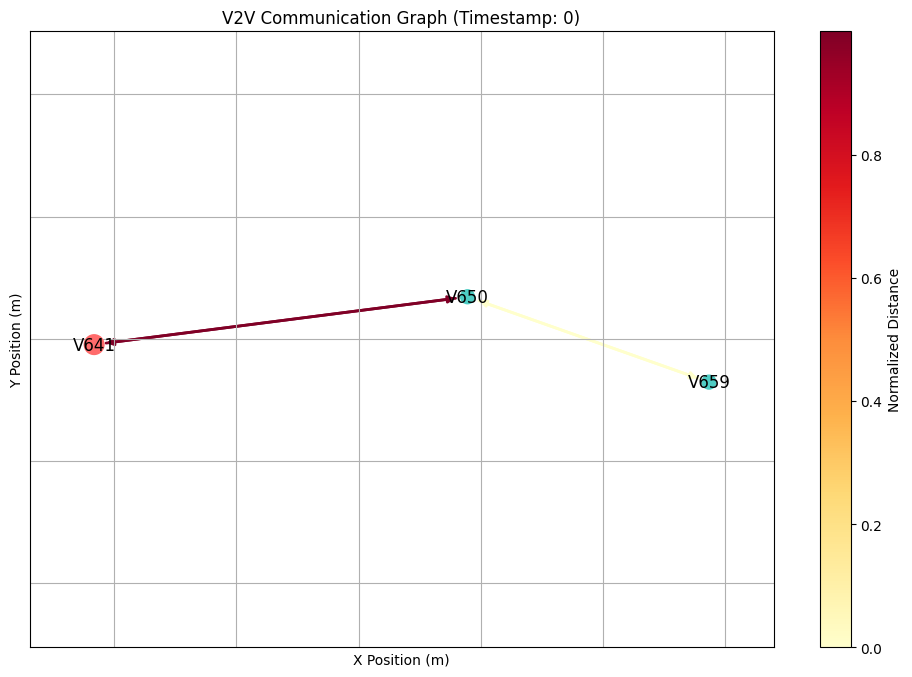

In [ ]:
visualizer = V2VGraphVisualizer()
visualizer.visualize_single_timestamp(graph)

In [30]:
anim=visualizer.visualize_temporal_sequence(temporal_graphs)

Pre-computing graph layouts...


Processing frames:   0%|          | 0/493 [00:00<?, ?it/s]

Processing frames: 100%|██████████| 493/493 [00:00<00:00, 73628.82it/s]

Creating animation...
Displaying animation...


In [31]:
HTML(anim.to_jshtml())